# ***Transient potential flow modeling for thin, lifting airfoils*** 

<h6 align = "right">Shantanu Bailoor <br/>
G44942912 </h6>

## <b><i>1. Introduction</i></b>

<p align='justify'>
<h7 align='justify'>
Through the  Aero/Hydro course [<font color='ff0000'>1</font>], we learned techniques for modeling steady-state potential flow response of various canonical bodies. However the most critical design constraints on aerodynamic bodies like airfoils arise from flight instants when the surrounding flow cannot be approximated by a steady state. Likewise, the most important flow characteristics, pertaining to vortical structures, are lost in a steady state analysis. Transient aerodynamic analyses are particularly helpful in studying flows over accelerating bodies, bodies with complex propulsion mechanics, biological flows.
</h7>

<p align='justify'>
<h7 align='justify'>
With that in mind, the objective of this study is to develop a framework for modeling unsteady potential flow characteristics over aerodynamic bodies. In this report, flows are analyzed over thin, lifitng airfoils, although with some modifications, the procedure presented herein can be extended to suit thick bodies as well.
</h7>

<p align='justify'>
<h7 align='justify'>
The report is organized as follows:
In section 2, the discrete vortex panel method is introduced and described in detail. Section 3 describes the alogirthm for modeling flow transience while Section 4 presents simulation results for flows past thin airfoils.
</h7>

In [1]:
import math
import numpy
from scipy import integrate
from matplotlib import pyplot, rcParams, animation, gridspec
from JSAnimation.IPython_display import display_animation

%matplotlib inline
%run animation_modules.ipynb

## <b><i>2. The Discrete Vortex Panel Method</i></b>

<p align='justify'>
<h7 align='justify'>
The discrete source panel method described in the "Aero-Hydro" course is incapable of generating circulation around a body and is, therefore, limited only to non-lifting airfoils. The constant-strength source (or the discrete doublet) panel method can be used to model circulation and can, thus, be used for modeling flows around thick, lifting airfoils. However, implementing this method can result in ill-conditioned influence matrices and requires preconditioning to make the matrix diagonally-dominant. Further, the method necessitates additional wake panels to satisfy the Kutta condition which increases the number of equations to be solved at each time-step.
</h7>

<p align='justify'>
<h7 align='justify'>
To overcome these difficulties, a Discrete Vortex Panel Method (DVPM) [<font color="ff0000">2</font>] is implemented in this report. The DVPM is suited to thin, lifting airfoils which, in this report, are represented using camber lines of NACA four-digit airfoils. In the DVPM, a vortex singularity is placed at a convenient location on the panel. Further, it results in very simple relations between the individual panel vortex circulations and induced velocity components outside the panel. However, the greatest advantage of the DVPM is that it inherently satisfies the Kutta condition and does not require additional wake panels [<font color="ff0000">2</font>] and this will be demonstrated in subsequent sections of the report. For a panel with a vortex of circulation $\Gamma$, located at its center $(x_{c},y_{c})$, the velocity components induced at a point at a distance $r$ from the panel center are:
</h7>
<p>

$$
\begin{pmatrix}
    u \\\
    v
\end{pmatrix} 
= \frac { \Gamma }{ 2\pi r^2 }
\begin{pmatrix}
    0 & 1 \\\
    -1 & 0
\end{pmatrix}
\begin{pmatrix}
    x-x_{c} \\\
    y-y_{c}
\end{pmatrix}
$$

<p align='justify'>
<h7 align='justify'>
The streamlines induced around such an isolated vortex panel are as shown in <font color="ff0000">Figure 1</font>. 
</h7>

![DVMP streamlines](./Images/DVPM_flow.png)
<h5 align='center'>Figure 1: Velocity vectors around an isolated discrete vortex panel</h5>

### <b><i>2.1 Problem of singularity and the staggered DVPM</i></b>

<p align='justify'>
<h7 align='justify'>
To satisfy the no-penetration boundary condition over a surface discretized with multiple panels, a system of equations is constructed, where the coefficient matrix reflects the normal component of the velocity induced by discrete panels on other panels, while the RHS vector is the normal component of the free-stream velocity on each panel. The diagonal entries of the influence matrix represent the normal velocity of a panel induced on itself. 
</h7>

<p align='justify'>
<h7 align='justify'>
A discrete, potential vortex creates only tangential velocity around itself (<font color="ff0000">Figure 1</font>). Thus, the vortex induces no normal velocity on itself. Thus, the diagonal entries of the influence matrix would be zero. Such an ill-conditioned matrix would be impossible to invert, making this approach unfavorable. To solve this problem, the vortex point and velocity collocation point can be placed at different locations on the panel, i.e. they are staggered over the length of the panel. In the present analysis, the vortex point is situated a quarter panel chord-length, while the velocity collocation point is placed at three-quarters panel chord-length, in accordance with [<font color="ff0000">2</font>]. A schematic of a staggered panel is illustrated in the following <font color="ff0000">Figure 2</font>.
</h7>


![Staggered Panel](./Images/DVPM_staggered.png)
<h5 align='center'>Figure 2: Vortex and velocity collocation point for a staggered panel</h5>

A class for staggered vortex panels and point vortices can be defined as follows:

In [2]:
class Panel:
    '''
    Define Panel constructor:
    Parameters :
    xa, ya     : Coordinates of starting point
    xb, yb     : Coordinates of ending point
    xvc, yvc   : Coordinates of velocity collocation point
    xvor, yvor : Coordinates of vortex point
    gamma      : Circulation/ strength of vortex
    '''
    def __init__(self, xa, ya, xb, yb, gamma):
        #Start and end points
        self.xa, self.xb = xa, xb
        self.ya, self.yb = ya, yb
        
        #Center and length
        self.xc, self.yc = 0.5*(xa+xb), 0.5*(ya+yb)
        self.length = math.sqrt((xb-xa)**2 + (yb-ya)**2)
        
        #Define Vortex point
        self.xvor = xa + 0.25*(xb-xa)
        self.yvor = ya + 0.25*(yb-ya)
        
        #Define velocity collocation point
        self.xvc = xa + 0.75*(xb-xa)
        self.yvc = ya + 0.75*(yb-ya)
        
        #Panel strength
        self.gamma = gamma
        
        # orientation of the panel (angle between x-axis and panel's normal)
        if xb-xa <= 0.:
            self.beta = math.acos((yb-ya)/self.length)
        elif xb-xa > 0.:
            self.beta = math.pi + math.acos(-(yb-ya)/self.length)
        
        self.n = [ math.cos(self.beta), math.sin(self.beta)]
        self.t = [-math.sin(self.beta), math.cos(self.beta)]
        
        self.vt = 0.0; self.vn = 0.0
        self.cp = 0.0

In [3]:
class Vortex:   
    '''
    Define Vortex constructor:
    Parameters:
    xvor, yvor : Coordinates of vortex
    gamma      : Circulation/ strength of vortex
    '''
    def __init__(self, xvor, yvor, gamma):
    
        #Define eye of vortex
        self.xvor = xvor
        self.yvor = yvor

        #Define strength
        self.gamma = gamma

Likewise, a function for defining velocity components at any point $(X_g, Y_g)$ can be defined as follows:

In [4]:
def get_vortex_panel_velocity(Xg, Yg, p):
    '''
    Define function to compute induced velocity components
    due to ideal vortex:
    Parameters:
    p          : Panel which induces velocity
    Xg, Yg     : Coordinates of point at which velocity is induced
    '''
    r2 = (Xg-p.xvor)**2 + (Yg-p.yvor)**2
    
    u_p = p.gamma/(2.0*math.pi*r2)*(Yg-p.yvor)
    v_p = -p.gamma/(2.0*math.pi*r2)*(Xg-p.xvor)
    
    return u_p, v_p

## <b><i>3. Transient flow modeling algorithm</i></b>

<p align='justify'>
<h7 align='justify'>
A code designed for modeling steady potential flow across a thin airfoil can be adapted to simulate transient flow across the airfoil by making the following modifications:
</h7>

<p align='justify'>
<h7 align='justify'>
1. For the sake of simplicity, the fluid is assumed to be stationary and all relative motion between the airfoil and the fluid is a consequence of airfoil kinematics. Thus, at each time-step, the airfoil is displaced through an incremental distance, based on its current velocity and the normal velocity component on the airfoil surface includes its own prescribed velocity, instead of the velocity of the free-stream.
</h7>
<p align='justify'>
<h7 align='justify'>
2. During post-processing, the same corrections must be made in pressure calculations.
</h7>
<p align='justify'>
<h7 align='justify'>
3. A suitable wake vortex model must be incorporated to account for the time-varying circulation around the airfoil.
</h7>
<p align='justify'>
<h7 align='justify'>
The algorithm [<font color="ff0000">2</font>] is summarized in <font color="ff0000">Figure 3</font> and will be explained in greater detail in furture sections.
</h7>

![Transient Algorithm](./Images/Transient_algorithm_flowchart.png)
<h5 align='center'>Figure 3: Algorithm for modeling unsteady potential flow across lifting bodies</h5>

### <b><i>3.1 Geometry Definition</i></b>

<p align='justify'>
<h7 align='justify'>
As stated previously, the DVPM is suitable for thin, lifting bodies. Hence, a full section of a cambered NACA four-digit airfoil cannot be used. We can, however, represent the airfoil section using its camber line. In this report, all simulations are performed using the $NACA$ $2510$ airfoil camber line, which is given by the following equation [<font color="ff0000">2</font>] ($\href{https://en.wikipedia.org/wiki/NACA_airfoil} {WikiLink}$):
</h7>

\begin{equation*} y_{c} = \left\{ \begin{array}{cc}
m \frac{x}{p^2} \left( 2p - \frac{x}{c} \right) & 0 \leq x \leq pc  \\\
m \frac{c-x}{(1-p)^2} \left( 1  + \frac{x}{c} - 2p \right) & pc \lt x \leq c \\
\end{array} \right)
\end{equation*}

<p align='justify'>
<h7 align='justify'>
For $NACA 2510$, the parameters $p = 0.5$, $c = 1.0$ and $m = 0.02$. Functions can be defined as follows to create the camber line and rotate it about its center of mass, located at $\frac{c}{4}$ from the leading edge.
</h7>

In [5]:
def create_camber_line(xc, c, p, m):
    '''
    Subroutine takes x-coordinate on camber line
    and returns corresponding y-coordinate
    '''
    if (xc >= 0.0 and xc <= p*c):
        yc = m*xc/p**2*(2.0*p - xc/c)
    elif (xc >= p*c and xc <= c):
        yc = m*(c-xc)/(1-p)**2*(1.0 - 2.0*p + xc/c)
    
    return(yc)

In [6]:
def rotate_coord(xco, yco, x0, y0, angle):
    '''
    Function to rotate the coordinates of
    a point about another reference point.
    Parameter:
    xco, yco : Coordinates of point to be rotated
    x0, y0   : Coordinates of reference point
    angle    : angle of rotation
    '''
    xnew = (xco-x0)*numpy.cos(angle) - (yco-y0)*numpy.sin(angle)
    ynew = (xco-x0)*numpy.sin(angle) + (yco-y0)*numpy.cos(angle)
    return (xnew+x0, ynew+y0)

The camberline geometry is then discretized into panels and vortex points and collocation points are defined for each panel. 

In [7]:
def create_airfoil_panels(panels, N_panels, angle, iplot):
    '''
    Function to call the airfoil camber lines
    generating function and assign coordinates
    to an array of vortex panels.
    '''
    c = 1.0; m = 0.02; p = 0.5

    xends1 = numpy.linspace(0.0, 1.0, N_panels + 1);
    xends = xends1 - 0.5
    yends = numpy.zeros_like(xends)

    for ip in range(N_panels+1):
        yends[ip] = create_camber_line(xends1[ip], c, p, m);

    for ip in range(N_panels+1):
        xends[ip], yends[ip] = rotate_coord(xends[ip], yends[ip],\
                            xends[0], yends[0], numpy.radians(-1.0*angle))

    for ip in range (N_panels):
        panels[ip] = Panel(xends[ip], yends[ip], xends[ip+1], yends[ip+1], 1.0)
        
    #---------------------------------------------------------------------------# 


    #---------------------------------------------------------------------------#
    if (iplot == 1):
        '''
        Plot the airfoil, vortex and collocation points and panel normals
        '''
        pyplot.figure(figsize=(6,6))
        pyplot.xlabel('x', fontsize=16)
        pyplot.ylabel('y', fontsize=16)
        pyplot.xlim(-0.55,0.55)
        pyplot.ylim(-0.55,0.55)
        pyplot.grid(True)

        pyplot.plot(xends, yends, color='#CD2305', linestyle='-', linewidth=2)
        pyplot.scatter([p.xvor for p in panels], [p.yvor for p in panels], \
                       color='k', marker='x', s=40, zorder=3)
        pyplot.scatter([p.xvc for p in panels], [p.yvc for p in panels], \
                       color='#0000FF', s=40, zorder=3)
        pyplot.quiver([p.xc for p in panels], [p.yc for p in panels], \
        [p.n[0] for p in panels], [p.n[1] for p in panels], scale=10, width=0.005)

        pyplot.title('Discretized camber-line for NACA 2510 indicating vortex and velocity points')
        pyplot.legend(['panels', 'vortex points', 'velocity collocation points','normal vectors'],\
                      loc='best', prop={'size':16})
    
    return panels

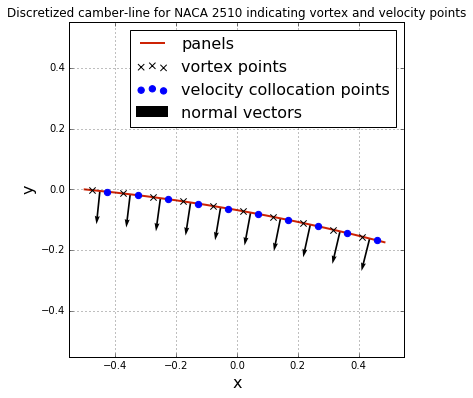

In [8]:
N_panels = 10; iplot = 1; angle = 10

panels = numpy.empty(N_panels,dtype='object')
panels = create_airfoil_panels(panels, N_panels, angle, iplot)

### <b><i>3.2 Update flight kinematics</i></b>

<p align='justify'>
<h7 align='justify'>
The first step within every new time iteration requires updating the position of the airfoil owing to prescribed motion. It may be simple streamwise translation, rotation or a complex combination of pitching and plunging, like in flapping wing flight. Based on the most recent velocity components, its coordinates are updated as:
</h7> <br><br>

\begin{equation*}
x^{(n)} = x^{(n-1)} + u^{(n-1)} \Delta t
\end{equation*}

\begin{equation*}
y^{(n)} = y^{(n-1)} + v^{(n-1)} \Delta t
\end{equation*}

<br>
<h7 align='justify'>
Here, the superscripts <i>n</i> and <i>n-1</i> are consecutive time levels, <i>x-</i> and <i>y-</i> the coordinates of the any given point on the airfoil and <i>u</i> and <i>v</i> the <i>x-</i> and <i>y-</i> components of the instantaneous velocity. <font color="ff0000">Figure 4</font> shows a schematic of an airfoil moving along an arbitrary curved path. 
</h7>

![Flight kinematics](./Images/Flight_kinematics.png)
<h5 align='center'>Figure 4: Schematic of flight kinematics</h5>

<p align='justify'>
<h7 align='justify'>
The following subroutines compute the positional increments of the airfoil, due to translation, pitching and plunging motion. 
</h7>

In [9]:
def translate_airfoil(p, u, v, delt):
    '''
    Subroutine to update panel position 
    owing to translation
    '''
    Np = numpy.size(p)
    
    for ip in range(Np):
        p[ip].xa += u*delt; p[ip].xb += u*delt; 

        p[ip].ya += v*delt; p[ip].yb += v*delt;

In [10]:
def pitch_plunge_airfoil(p, amp, omega, time, dt, angmax):
    '''
    Subroutine to update panel position
    owing to pitching-plunging motion
    '''
    Np = numpy.size(p)
    
    xcent0 = 0.25;
    ch_len = 1.0
    xcent = p[0].xa + 0.25*(p[-1].xb-p[0].xa)
    ycent0 = create_camber_line(xcent0, ch_len, 0.5, 0.02)
    
    ycent = ycent0  + (numpy.sin(omega*time)-numpy.sin(omega*(time-dt)))
    
    ang = numpy.radians(angmax)*(numpy.cos(omega*time)-numpy.cos(omega*(time-dt)))
    
    for ip in range(Np):
        tempx, tempy = rotate_coord(p[ip].xa, p[ip].ya, xcent, ycent, -1.0*ang)
        p[ip].xa = tempx; p[ip].ya = tempy
        tempx, tempy = rotate_coord(p[ip].xb, p[ip].yb, xcent, ycent, -1.0*ang)
        p[ip].xb = tempx; p[ip].yb = tempy
        
        p[ip].ya += amp*(numpy.sin(omega*time)-numpy.sin(omega*(time-dt)))
        p[ip].yb += amp*(numpy.sin(omega*time)-numpy.sin(omega*(time-dt)))

<h7 align='justify'>
Once the end-points of each panel have been updated, the positions of every panel center, vortex and collocation points can be updated. In addition, the panel orientation angles, normal and tangent vectors are also recomputed. This can be done in a function as defined as follows:
</h7>

In [11]:
def update_panel_attributes(p):
    '''
    Subroutine must be called immediately after 
    updating airfoil kinematics.
    
    Update the coordinates of center, vortex 
    and collocation points. Update orientation 
    angle, normal and tangent vectors
    '''
    Np = numpy.size(p);
    
    for ip in range(Np):
        #Recompute length:
        p[ip].length = math.sqrt((p[ip].xb-p[ip].xa)**2 + (p[ip].yb-p[ip].ya)**2)
        
        #Update angle of orientation:
        if p[ip].xb-p[ip].xa <= 0.:
            p[ip].beta = math.acos((p[ip].yb-p[ip].ya)/p[ip].length)
        elif p[ip].xb-p[ip].xa > 0.:
            p[ip].beta = math.pi + math.acos(-(p[ip].yb-p[ip].ya)/p[ip].length)
        
        #Update positions of center points:
        p[ip].xc = p[ip].xa + 0.5*(p[ip].xb - p[ip].xa)
        p[ip].yc = p[ip].ya + 0.5*(p[ip].yb - p[ip].ya)
        
        #Update positions of vortex points:
        p[ip].xvor = p[ip].xa + 0.25*(p[ip].xb - p[ip].xa)
        p[ip].yvor = p[ip].ya + 0.25*(p[ip].yb - p[ip].ya)
        
        #Update positions of center points:
        p[ip].xvc = p[ip].xa + 0.75*(p[ip].xb - p[ip].xa)
        p[ip].yvc = p[ip].ya + 0.75*(p[ip].yb - p[ip].ya)
        
        #Update normal and tangent vectors
        p[ip].n = [ math.cos(p[ip].beta), math.sin(p[ip].beta)]
        p[ip].t = [-math.sin(p[ip].beta), math.cos(p[ip].beta)]

### <b><i>3.3 Update panel and wake influence </i></b>
<p align='justify'>
<h7 align='justify'>
Once the airfoil position has been updated, the airfoil and wake vortex strengths are recomputed to enforce the zero-penetration boundary condition and the Kutta condition. After the airfoil is moved through an incremental displacement, described in the previous step, a point vortex is added in its wake. Thus, at the beginning of each time-step, a new wake vortex is created. Since the flow is inviscid, the wake vortices do not decay and all vortices shed up to the previous time-step have known strengths. Thus, the only wake vortex with unknown strength is the one shed in the current time-step. 
</h7>
<br>
<br>
<h7 align='justify'>
The influence matrix $A$ has the shape  $((N_{p}+1) \times (N_{p}+1))$, where $N_{p}$ is the number of panels. An additional row and column are needed for the most recent wake vortex. As done in the steady-state flow analyses, the matrix entry $a_{i,j}$ represents the normal component of induced velocity by the $j^{th}$ panel on the $i^{th}$ panel. It is important to note that since the vortex and velocity points are staggered $a_{i,i}$ $\neq 0$. If the shape of the airfoil does not change with time, the influence of airfoil vortices on each other does not change, and may be therefore computed at the beginning of the simulation. A function may to compute the first $(N_{p} \times N_{p})$ entries, thus, be written to compute panel influences.
</h7>

In [12]:
def get_panel_influence(p):
    '''
    Function to compute inflence of airfoil
    panels on each other.
    '''
    Np = numpy.size(p)
    Amat = numpy.zeros((Np,Np)); bmat = numpy.zeros(Np)
    
    for ip in range(Np):
        xp = p[ip].xvc; yp = p[ip].yvc; gam = p[ip].gamma
        for jp in range (Np):
            xvel, yvel = get_vortex_panel_velocity(xp, yp, p[jp])
            Amat[ip,jp] = numpy.dot([xvel, yvel], p[ip].n);
        
    return(Amat)

The last column of the matrix contains the influence of the most recent wake vortex on each panel. The following function is, thus, defined.

In [13]:
def get_wvortex_influence(p, vortex):
    '''
    Function to compute inflence of a wake 
    vortex on a panel.
    '''
    Np = numpy.size(p)
    Amat = numpy.zeros(Np); 
    
    for ip in range(Np):
        xp = p[ip].xvc; yp = p[ip].yvc; gam = p[ip].gamma
        xvel, yvel = get_vortex_panel_velocity(xp, yp, vortex)
        
        Amat[ip] = numpy.dot([xvel, yvel], p[ip].n);
        
    return(Amat)

<h7 align='justify'>
The first $N_p$ entries of the RHS vector, <i>b</i>, contain the negative normal component of the airfoil motion and induced velocities by all wake vortices created up to the previous time-step.
</h7>

\begin{equation*}
b_{i}^{n} = - \left[ \left( u^{n} + \sum_{in=1}^{n-1}u_{w}^{in} \right) , \left( v^{n} + \sum_{in=1}^{n-1}v_{w}^{in} \right) \right] \cdot n_{i}
\end{equation*}
<p align='justify'>
<h7 align='justify'>
where $u_{w}^{in}$ and $v_{w}^{in}$ are the <i>x-</i> and <i>y-</i> components of the velocity induced by the wake vortex created at iteration $in$ and $n_{i}$ is the normal vector of the $i^{th}$ airfoil panel. It needs to be noted that at time <i>t</i> = 0.0, there is no wake vortex, thus, the RHS vector will contain influences of the airfoil motion only. Thus, functions for generating the RHS vector can be written as follows:
</h7>

In [14]:
def get_RHS0(p, ufs, vfs):
    '''
    This subroutine is called at time t = 0
    '''
    xp = p.xvc; yp = p.yvc; gam = p.gamma; RHS = 0.0
    RHS -= numpy.dot([ufs, vfs], p.n)
    return(RHS)

In [15]:
def get_RHS(p, vortex, ufs, vfs):
    '''
    This subroutine is called at time t > 0
    '''
    Nv = numpy.size(vortex)
    xp = p.xvc; yp = p.yvc; gam = p.gamma; RHS = 0.0
    for iv in range(Nv):
        xvel, yvel = get_vortex_panel_velocity(xp, yp, vortex[iv])
        RHS -= numpy.dot([xvel, yvel], p.n)
            
    RHS -= numpy.dot([ufs, vfs], p.n)
        
    return(RHS)

<h7 align='justify'>
The last row of the A matrix and last entry of the RHS vector are used to satisfy the Kelvin condition, which helps us simulate transient response. The Kelvin condition indicates that the flow around the body being inviscid, any changes in circulation around the body must be balanced by the latest wake vortex. Thus, it may be expressed as:
</h7><br><br>

\begin{equation*}
\sum_{j=1}^{N_{p}} \Gamma_{j}(t) - \sum_{j=1}^{N_{p}} \Gamma_{j}(t-\Delta t) + \Gamma_{w} = 0 
\end{equation*}

or 

\begin{equation*}
\sum_{j=1}^{N_{p}} \Gamma_{j}(t) + \Gamma_{w} = \sum_{j=1}^{N_{p}} \Gamma_{j}(t-\Delta t) 
\end{equation*}

<p align='justify'>
<h7 align='justify'>
The term on the right hand side is the sum of the airfoil strengths from the previous time-step, and is known. 
</h7>


### <b><i>3.4 Wake vortex shedding </i></b>

<p align='justify'>
<h7 align='justify'>
At time, t = 0, before the airfoil has begun moving, there are no wake vortices. However, the airfoil vortices create a net circulation around the airfoil which needs to be balanced. Thus, a start-up vortex is generated at the airfoil's trailing edge. The circulation of this vortex, $\Gamma_w^0$, is equal to the sum of the airfoil vortex circulations and has its opposite sign (<font color='ff0000'>Figure 5</font> (top)).
</h7>

<p align='justify'>
<h7 align='justify'>
As the airfoil moves, at each time-step, a wake vortex is shed and is placed at $20-30\%$ of the distance traveled by the airfoil, from the trailing edge of the airfoil. Since the flow is inviscid, the wake vortices do not decay and their strengths stay the same over time. Thus, only the most recently shed vortex has unknown strength, $\Gamma_w^n$, which needs to be solved at every time-step (<font color='ff0000'>Figure 5</font> (bottom)).
</h7>

![Wake vortices](./Images/Wake_vortices.png)
<h5 align='justify'>Figure 5: Schematic of wake vortex shedding. (Top) A start-up vortex is generated at the trailing edge of the airfoil at time t = 0. The strength of the start-up vortex is equal to the negative sum of strengths of the airfoil vortices. (Bottom) A series of wake vortices shed by the airfoil at time instants up to t = n. </h5>

<p align='justify'>
<h7 align='justify'>
The following subroutine is defined to simulate transient potential flow.
</h7>

In [16]:
def iterate(panels, ITERMAX, dt, imotion, iplot_vel):
    '''
    Subroutine to simulate transient response of 
    moving airfoil in steady potential flow.
    
    Parameters:
    ----------
    panels    : An array of panel objects
    ITERMAX   : Maximum iterations for time integration
    dt        : time-step size
    imotion   : Flag defining airfoil motion
                IF 0: Only translation
                If 1: Translation + pitching/ plunging
    iplot_vel : Flag to return velocity fields
                If 0: only Cp values are returned
                If 1: u, v and vel magnitude
                and Cp values are returned
    '''
    #Initialize time parameters
    t0 = 0.0; 
    tmax = t0 + ITERMAX*dt
    time = t0
    #----------------------------------------------------------#


    #----------------------------------------------------------#

    #Define panel translation velocity
    upanel = 1.0*numpy.cos(numpy.radians(180))
    vpanel = 1.0*numpy.sin(numpy.radians(180))

    #Define output data structures
    plot_data = numpy.zeros((ITERMAX,N_panels,2))
    plot_wvor = numpy.zeros((ITERMAX+1,2))

    #Array for wake-vortices
    wvor = numpy.empty(ITERMAX+1,dtype='object')
    #----------------------------------------------------------#


    #----------------------------------------------------------#
    N = 101
    x_start, x_end = -4.0, 0.75              # boundaries in the x-direction
    y_start, y_end = -0.75, 0.75             # boundaries in the y-direction
    x = numpy.linspace(x_start, x_end, N)    # creates a 1D-array with the x-coordinates
    y = numpy.linspace(y_start, y_end, N)    # creates a 1D-array with the y-coordinates
    X, Y = numpy.meshgrid(x, y)              # generates a mesh grid

    uplot = numpy.zeros((ITERMAX,N,N))
    vplot = numpy.zeros((ITERMAX,N,N))

    plot_panels = numpy.zeros((ITERMAX,N_panels,2))
    plot_Cp_data = numpy.zeros((ITERMAX,N_panels))
    plot_Len = numpy.linspace(panels[0].xvc, panels[-1].xvc, N_panels)
    plot_Len += 0.5
    #----------------------------------------------------------#


    #----------------------------------------------------------#
    #Pitch-plunge related parameters
    amp = 0.1;
    omega = 2.0*math.pi/tmax
    ang_max = 10
    #----------------------------------------------------------#


    #----------------------------------------------------------#
    #Define solution matrices
    A0 = numpy.zeros((N_panels,N_panels))
    b0 = numpy.zeros(N_panels)

    A = numpy.zeros((N_panels+1, N_panels+1)); 
    b = numpy.zeros(N_panels+1)
    #----------------------------------------------------------#


    #----------------------------------------------------------#
    #Get initial airfoil strengths
    A0 = get_panel_influence(panels)
    for ip in range(N_panels):
        b0[ip] = get_RHS0(panels[ip], -upanel, -vpanel)

    xgam0 = numpy.linalg.solve(A0,b0)
    xgam_n = numpy.copy(xgam0)

    sum_gam = 0.0
    for ip in range(N_panels):
        sum_gam += xgam_n[ip]

    #Create start-up vortex
    wvor[0] = Vortex(panels[-1].xb, panels[-1].yb, -1.0*sum_gam) 
    plot_wvor[0,0] = panels[-1].xb
    plot_wvor[0,1] = panels[-1].yb

    A[:-1,:-1] = numpy.copy(A0)
    #----------------------------------------------------------#


    #----------------------------------------------------------#
    ic_vor = 1
    for iter in range(ITERMAX):

        xbend = panels[-1].xb; ybend = panels[-1].yb

        #----------------------------------------------------------#
        #Kinematics
        translate_airfoil(panels, upanel, vpanel, dt)
        
        #Condition for pitching-plunging motion
        if (imotion == 1):
            pitch_plunge_airfoil(panels, amp, omega, time, dt, ang_max)
        
        update_panel_attributes(panels)

        for ip in range(N_panels):
            plot_data[iter, ip, 0] = panels[ip].xb
            plot_data[iter, ip, 1] = panels[ip].yb

        #----------------------------------------------------------#
        #Add Wake vortex  
        dispx = panels[-1].xb - xbend        
        dispy = panels[-1].yb - ybend        

        #----------------------------------------------------------#
        #Create new vortex location
        xlocv = panels[-1].xb - 0.25*dispx
        ylocv = panels[-1].yb - 0.25*dispy

        plot_wvor[ic_vor,0] = xlocv
        plot_wvor[ic_vor,1] = ylocv

        #----------------------------------------------------------#
        #Create vortex object
        wvor[ic_vor] = Vortex(xlocv, ylocv, 1.0)

        #----------------------------------------------------------#
        #Append linear algebra system for transience
        A[:-1,-1] = get_wvortex_influence(panels, wvor[ic_vor])
        A[-1,:] = numpy.ones(N_panels+1);

        for ip in range(N_panels):
            if (iter == 0):
                b[ip] = numpy.copy(b0[ip])
            else:
                b[ip] = get_RHS(panels[ip], wvor[:ic_vor], -upanel, -vpanel)

        sum_gam = 0.0

        for jp in range(N_panels):
            sum_gam += xgam_n[jp]

        b[-1] = sum_gam

        #----------------------------------------------------------#       
        #Solve system of equations
        xgam_n = numpy.linalg.solve(A,b)

        for ip in range (N_panels):
            plot_panels[iter,ip,0] = panels[ip].xvor
            plot_panels[iter,ip,1] = panels[ip].yvor
            panels[ip].gamma = xgam_n[ip]
            panels[ip].vt = 0.0; panels[ip].vn = 0.0; 
            panels[ip].cp = 0.0

        wvor[ic_vor].gamma = xgam_n[-1]

        ic_vor += 1; time += dt    

        #----------------------------------------------------------#
        #Create flow fields
        if (iplot_vel == 1):
            
            for i in range(N):
                for j in range(N):
                    for ip in range (N_panels):
                        xp = panels[ip].xvc; 
                        yp = panels[ip].yvc; 
                        gam = panels[ip].gamma

                        velx, vely = get_vortex_panel_velocity(X[i,j], Y[i,j], \
                                                               panels[ip])
                        uplot[iter,i,j] += velx; vplot[iter,i,j] += vely

                    for ivor in range(ic_vor):
                        velx, vely = get_vortex_panel_velocity(X[i,j], Y[i,j], \
                                                               wvor[ivor])
                        uplot[iter,i,j] += velx; vplot[iter,i,j] += vely

            uplot[iter,:,:] -= upanel; vplot[iter,:,:] -= vpanel
            plot_vel = numpy.sqrt(uplot**2 + vplot**2)


        #----------------------------------------------------------#
        #Compute Cp values
        for ip in range (N_panels):
            xp = panels[ip].xvc; 
            yp = panels[ip].yvc; 
            gam = panels[ip].gamma

            panels[ip].vt = 0.
            panels[ip].vn = 0.

            for jp in range (N_panels):
                xvel, yvel = get_vortex_panel_velocity(xp, yp, panels[jp])
                panels[ip].vt += numpy.dot([xvel, yvel], panels[ip].t)
                panels[ip].vn += numpy.dot([xvel, yvel], panels[ip].n)

            for ivor in range(ic_vor):
                xvel, yvel = get_vortex_panel_velocity(xp, yp, wvor[ivor])
                panels[ip].vt += numpy.dot([xvel, yvel], panels[ip].t)
                panels[ip].vn += numpy.dot([xvel, yvel], panels[ip].n)

            panels[ip].vt += numpy.dot([-upanel, -vpanel], panels[ip].t)
            panels[ip].vn += numpy.dot([-upanel, -vpanel], panels[ip].n)

            panels[ip].cp = 1.0 - (panels[ip].vn**2 + panels[ip].vt**2)\
                                    /(upanel**2+vpanel**2)

            plot_Cp_data[iter,ip] = panels[ip].cp


    #----------------------------------------------------------#
    #Return values
    if (iplot_vel == 1):
        return X, Y, uplot, vplot, plot_vel,  plot_Cp_data, plot_panels
    else:
        return plot_Cp_data, plot_panels

<p align='justify'>
<h7 align='justify'>
A similar subroutine can be defined to generate steady-flow characteristics around a thin airfoil. This case is used later for validating the transient flow accuracy.
</h7>

In [17]:
def steady_state_Cp(p):
    '''
    Function to compute the steady-state
    coefficient of pressure on an airfoil.
    '''
    N_p = numpy.size(p)
    
    uinf = 1.0*numpy.cos(numpy.radians(0)); 
    vinf = 1.0*numpy.sin(numpy.radians(0))

    A = numpy.zeros((N_p, N_p)); b = numpy.zeros(N_p)

    for ip in range (N_p):
        p[ip].gamma = 1.0

    for ip in range (N_p):
        xp = p[ip].xvc; yp = p[ip].yvc; gam = p[ip].gamma
        for jp in range (N_p):
            xvel, yvel = get_vortex_panel_velocity(xp, yp, p[jp])
            A[ip,jp] = numpy.dot([xvel, yvel], p[ip].n)

        b[ip] = -1.0*numpy.dot([uinf, vinf], p[ip].n)

    xgamma = numpy.linalg.solve(A,b);

    for ip in range (N_p):
        p[ip].gamma = xgamma[ip]

    for ip in range (N_p):
        xp = p[ip].xvc; yp = p[ip].yvc; gam = p[ip].gamma

        for jp in range (N_p):
            xvel, yvel = get_vortex_panel_velocity(xp, yp, p[jp])
            p[ip].vt += numpy.dot([xvel, yvel], p[ip].t)
            p[ip].vn += numpy.dot([xvel, yvel], p[ip].n)

        p[ip].vt += numpy.dot([uinf, vinf], p[ip].t)
        p[ip].vn += numpy.dot([uinf, vinf], p[ip].n)

        p[ip].cp = 1.0-(p[ip].vt**2 + p[ip].vn**2)/(uinf**2+vinf**2)
        
    return p

## <b><i>4. Results and Discussion</i></b>

### <b><i>4.1 Transient flow past translating, thin airfoil with positive AoA</i></b>

<p align='justify'>
<h7 align='justify'>
Now that the DVPM and transient potential flow algorithm have been coded, we can run a few simulations to model flows past thin, airfoils with different configurations. In the first test, a lamina representing the camber-line of a <i>NACA 2510</i> airfoil with a $10^{\circ}$ angle of attack is moved to the left, through stationary fluid. This may be regarded as a suddenly accelerated, inclined plate.
</h7>


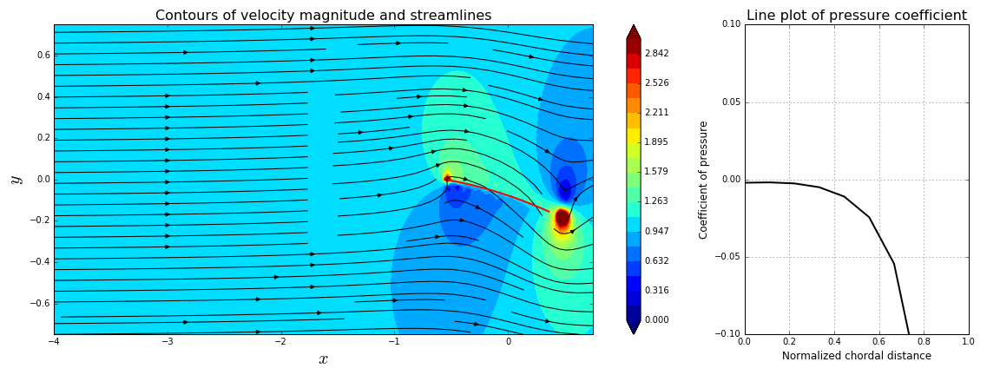
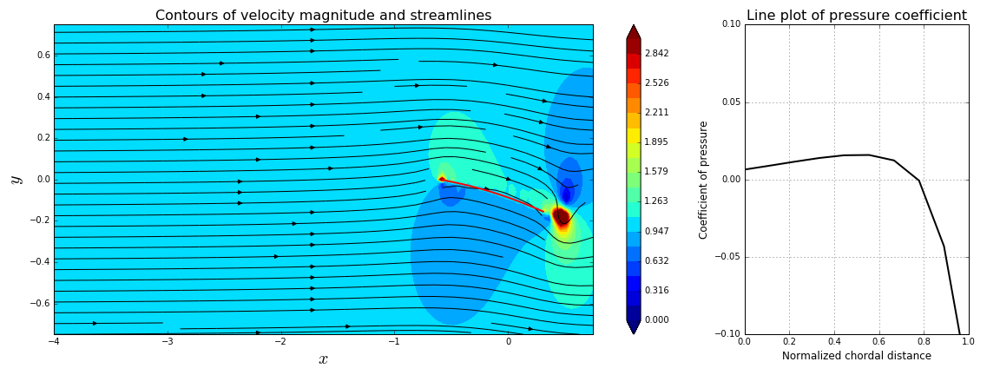
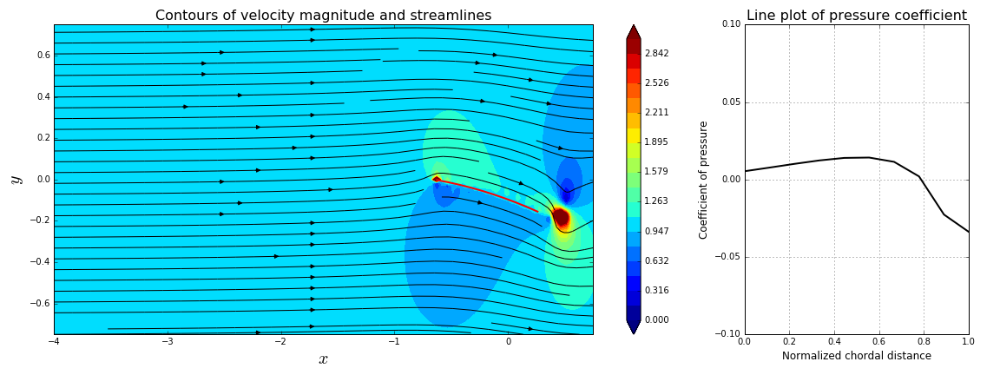
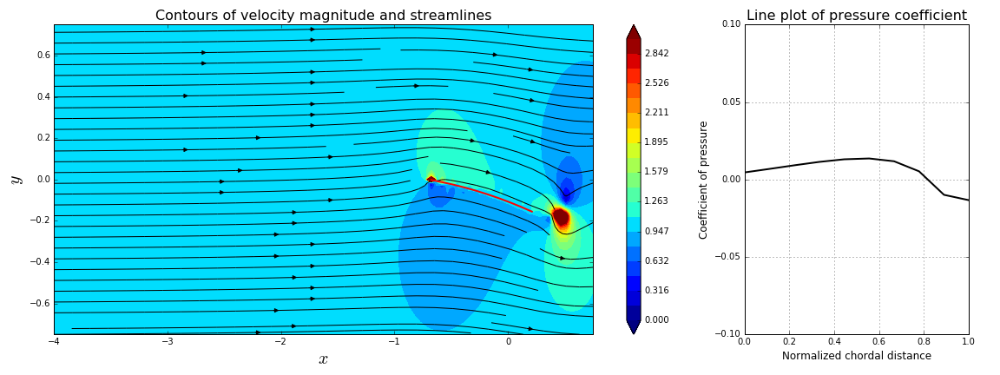
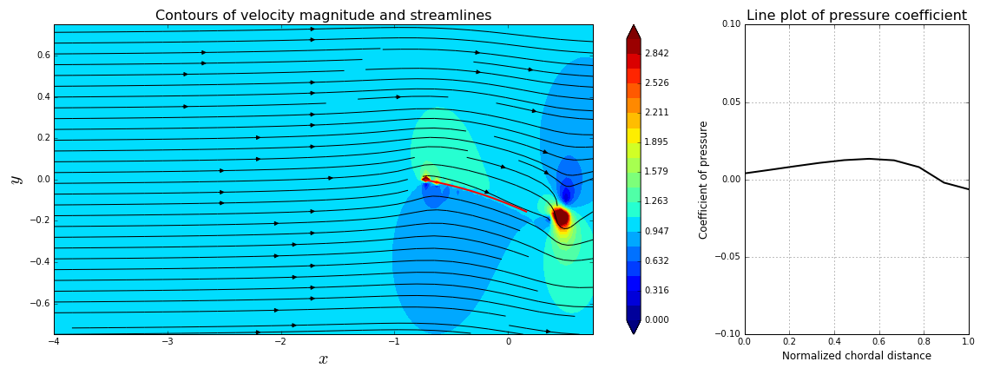
...
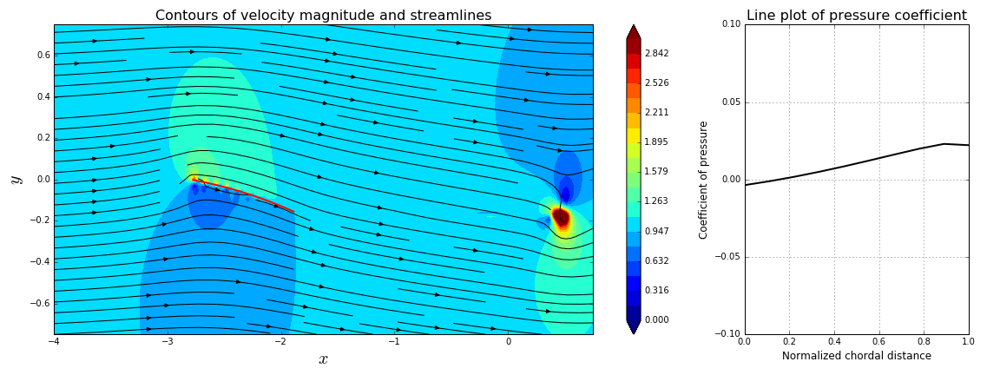
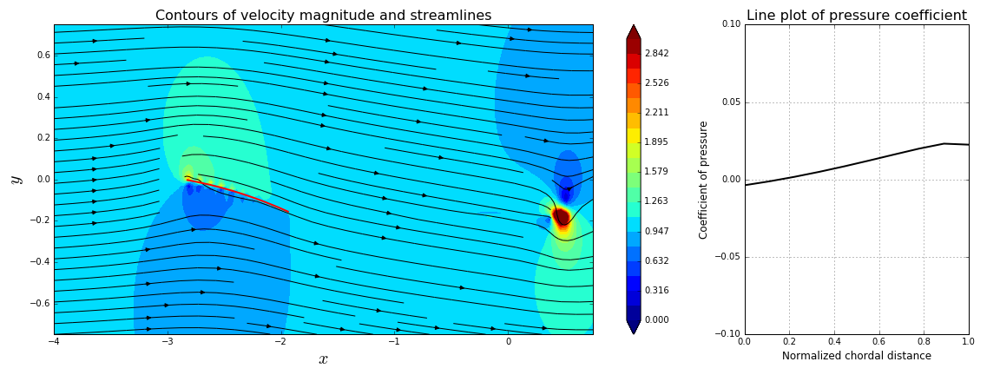
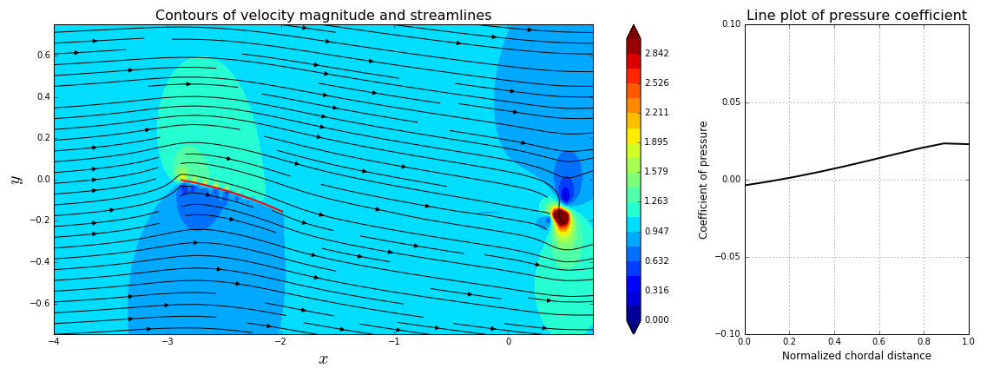
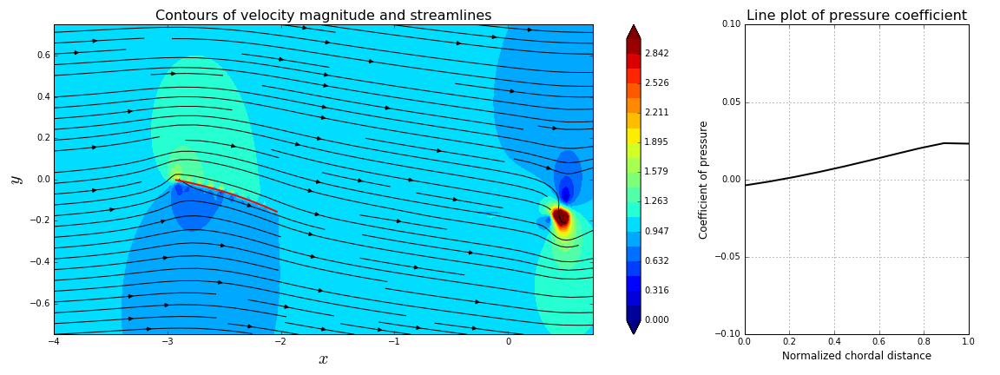
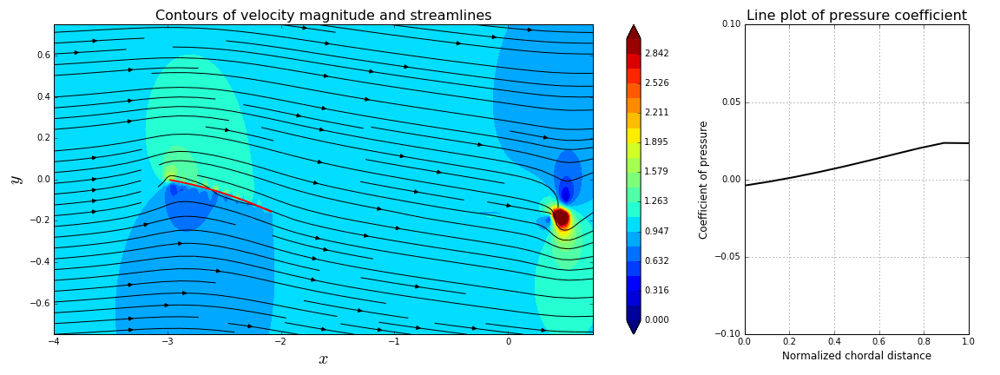

In [18]:
'''
Simulation of transient flow past 
airfoil at AoA 10 degrees
'''

N_panels = 10
ITERMAX = 50; dt = 0.05

#for iterate
imotion = 0; iplot_vel = 1
#for panels
AoA = 10; iplot_pan = 0

panels = numpy.empty(N_panels,dtype='object')

panels = create_airfoil_panels(panels, N_panels, AoA, iplot_pan)

X, Y, uplot, vplot, plot_vel,  plot_Cp_data, plot_panels = \
        iterate(panels, ITERMAX , dt, imotion, iplot_vel)
    
create_contour_animation(ITERMAX, X, Y, uplot, vplot, plot_vel,  plot_Cp_data, plot_panels)

<p align='justify'>
<h7 align='justify'>
It is observed that a region of high velocity magnitude (low pressure) develops above the airfoil, while a region of low velocity magnitude (high pressure) develops below the airfoil. This would mean that a net upward force is exerted on the airfoil by the fluid, which makes intuitive sense, since an airfoil moving with positive AoA, through stationary fluid, is expected to generate positive lift. In saying so, it must be noted that the velocity contours and streamlines represent the relative velocity between the fluid and the airfoil. Further, the streamlines at the trailing edge, at all times, run tangent to the airfoil profile, which indicates that the Kutta condition is satisfied. 
</h7>

<p align='justify'>
<h7 align='justify'>
At time $t = 0$, a start-up vortex is generated at the trailing edge, with circulation that balances the sum of all the airfoil circulations. The trailing edge is attached to a region of high velocity (low pressure). This is also reflected in the animation of $C_p$, where the initial pressure near the trailing edge is negative. As the airfoil moves further away from the start-up vortex, its influence on the airfoil diminishes and the trailing edge $C_p$ increases. Thus, as the simulation progresses, the $C_p$ increases from a low, negative negative value at the leading edge to a higher, positive value at the trailing edge.
</h7>

<p align='justify'>
<h7 align='justify'>
So we have pretty pictures that make sense too, but how do we know the results are accurate? One way to ascertain this is by running the above simulation for a very long time, so that the influence of the start-up vortex is negligible, and compare the obtained results with those of a steady-state analysis. Alternatively, we can use a large time-step and reach this state in fewer iterations. It is worth noting that this is possible for panel methods as they are not limited by stability constraints like other numerical methods. 
</h7>

<p align='justify'>
<h7 align='justify'>
So let's run and compare the results of the following simulation cases:
</h7>

1. Steady-state analysis of <i>NACA 2510</i> camber-line with <i>AoA</i> = $10^{\circ}$.
2. Transient analysis of <i>NACA 2510</i> camber-line with <i>AoA</i> = $10^{\circ}$ and $\Delta t$ = 2.0.

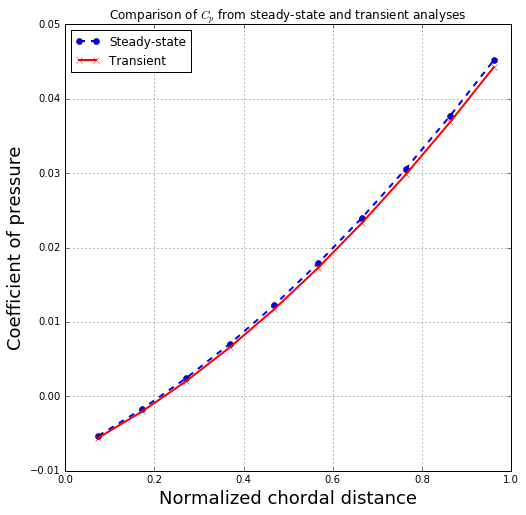

In [19]:
'''
Comparison between results from steady-state
and transient flow analyses.
'''

N_panels = 10
ITERMAX = 25; dt = 2.0

#for iterate
imotion = 0; iplot_vel = 0
#for panels
AoA = 10; iplot_pan = 0
#-----------------------------------------------------------------#


#-----------------------------------------------------------------#
#Define panels for steady-state and transient analyses
pan_stat = numpy.empty(N_panels,dtype='object')
pan_dyna = numpy.empty(N_panels,dtype='object')

pan_stat = create_airfoil_panels(pan_stat, N_panels, AoA, iplot_pan)
pan_dyna = create_airfoil_panels(pan_dyna, N_panels, AoA, iplot_pan)

x_CL = numpy.linspace(pan_stat[0].xvc+0.5, pan_stat[-1].xvc+0.5, N_panels)
#-----------------------------------------------------------------#


#-----------------------------------------------------------------#
pan_stat = steady_state_Cp(pan_stat)

plot_Cp_data, plot_panels = iterate(pan_dyna, ITERMAX , dt, imotion, iplot_vel)
#-----------------------------------------------------------------#


#-----------------------------------------------------------------#
#Plot data
pyplot.figure(figsize=(8,8))
pyplot.grid(True)
pyplot.xlim(0, 1.0)
pyplot.ylim(-0.01, 0.05)
pyplot.title('Comparison of $C_p$ from steady-state and transient analyses', fontsize=12)
pyplot.xlabel('Normalized chordal distance', fontsize=18)
pyplot.ylabel('Coefficient of pressure', fontsize=18)
pyplot.plot(x_CL, [p.cp for p in pan_stat], color='b', ls='--', \
              lw=2, marker='o', label = 'Steady-state')
pyplot.plot(x_CL, [p.cp for p in pan_dyna], color='r', ls='-', \
              lw=2, marker='x', label = 'Transient')
pyplot.legend(loc= 'best');

<p align='justify'>
<h7 align='justify'>
Thus, we see that the results obtained from the two analyses are in very good agreement, providing a validation of the transient simulation results. We can now explore more interesting fluid mechanics observed for complex airfoil kinematics.
</h7>

### <b><i>4.2 Transient flow past pitching and plunging, thin airfoil</i></b>

<p align='justify'>
<h7 align='justify'>
In this case, the airfoil motion is a sum of three components (<font color='ff0000'>Figure 6</font>):
</h7>

1. Uniform streamwise translational velocity (<i>u</i>).
2. Oscillatory normal velocity (<i>v</i>), called plunging.
3. Oscillatory angular velocity ($\omega$), called pitching.

<p align='justify'>
<h7 align='justify'>
The airfoil is rotated about its center of mass, which is typically on the camber-line and quarter chord length from the leading edge. The duration of simulation is one period of oscillation. 
</h7>

![Wake vortices](./Images/Pitch_plunge.png)
<h5 align='justify'>Figure 6: Illustration of pitching and plunging motion, depicting its constituent motions.</h5>


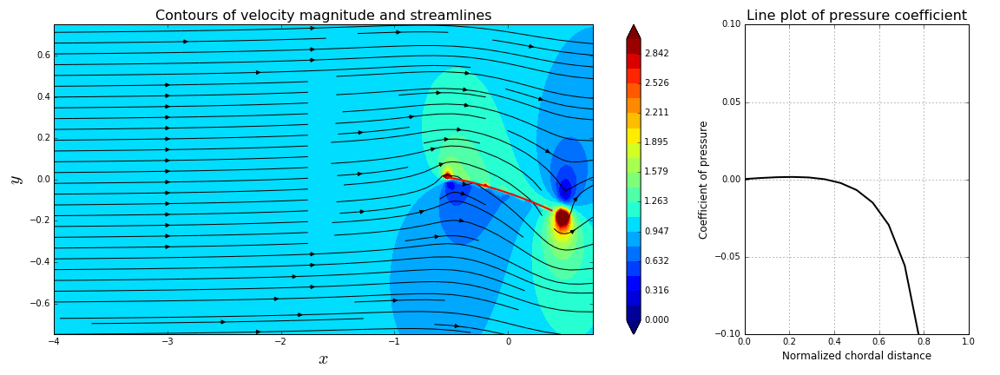
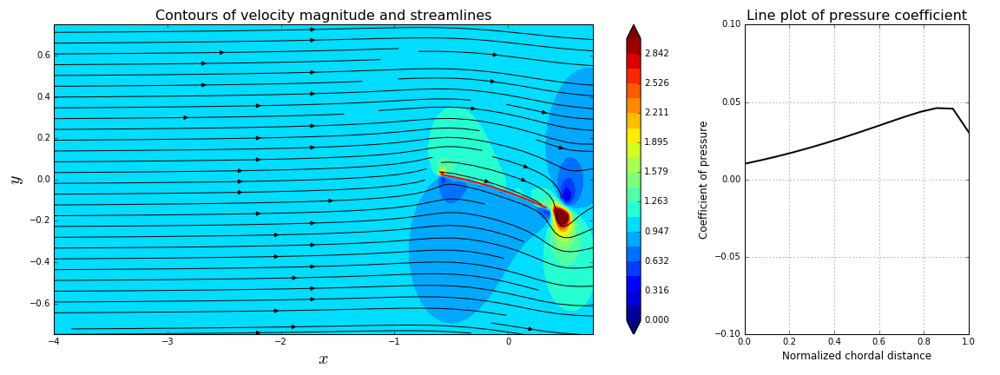
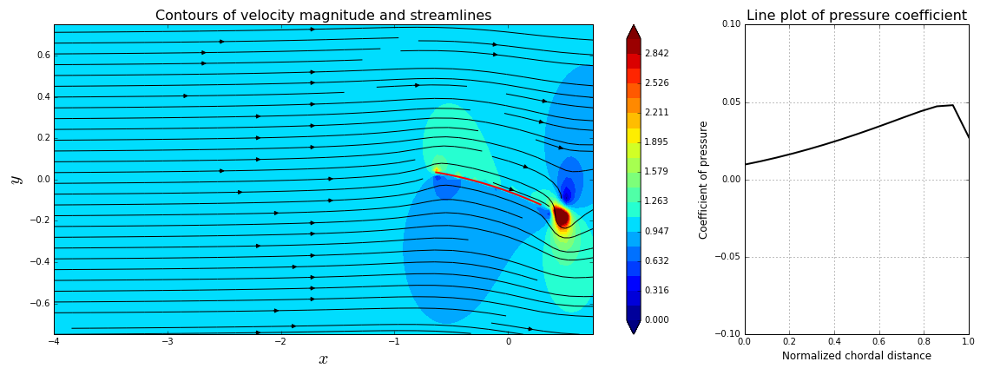
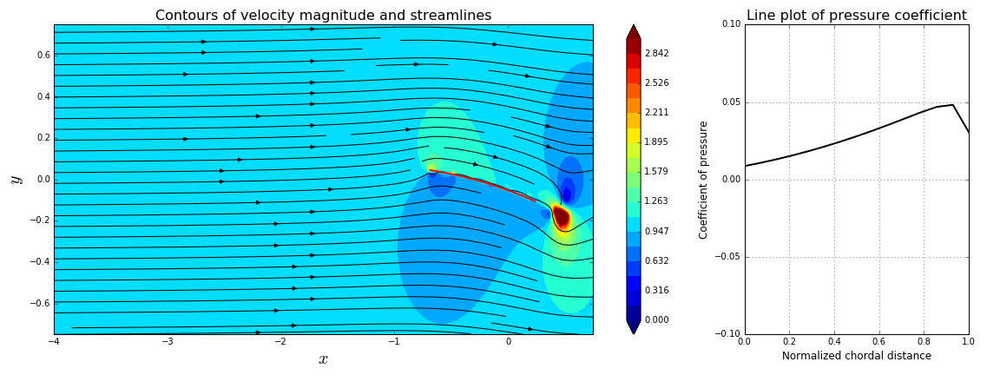
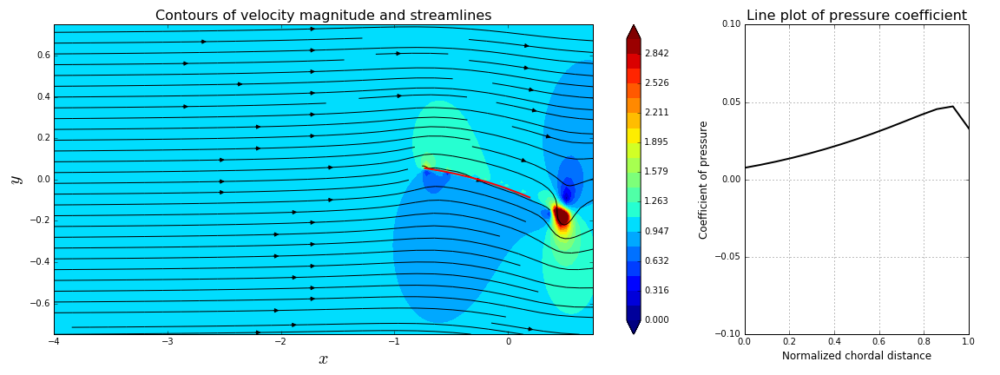
...
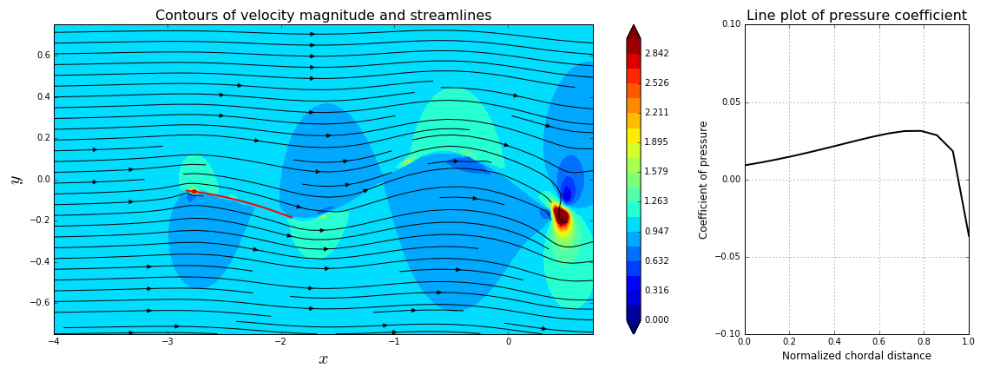
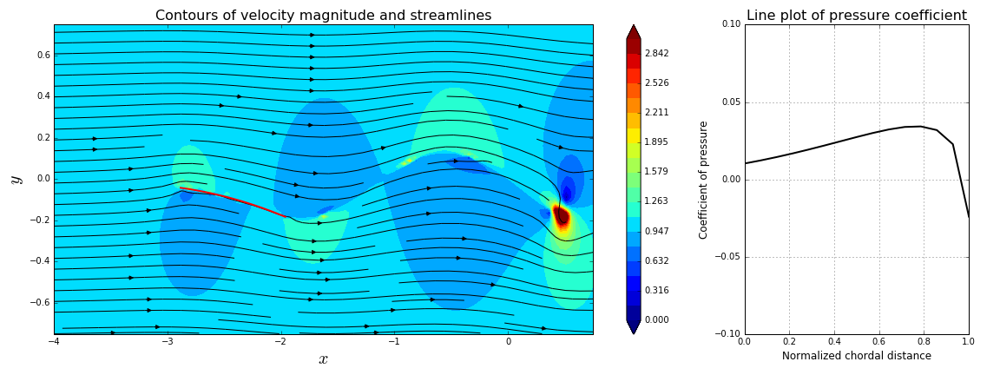
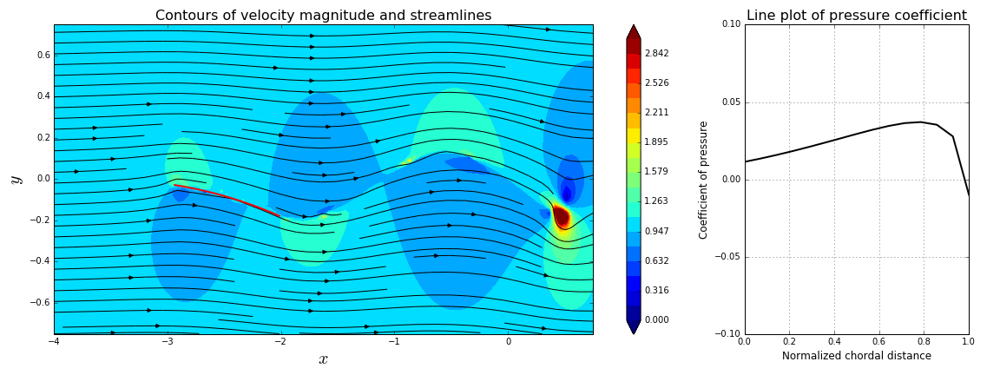
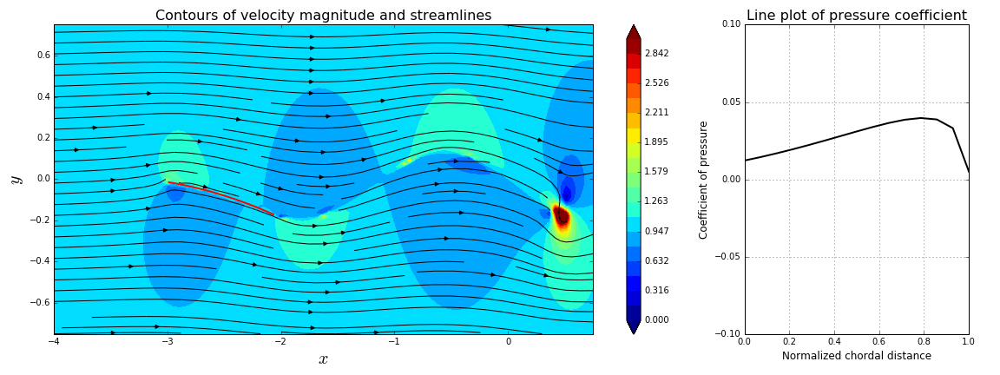
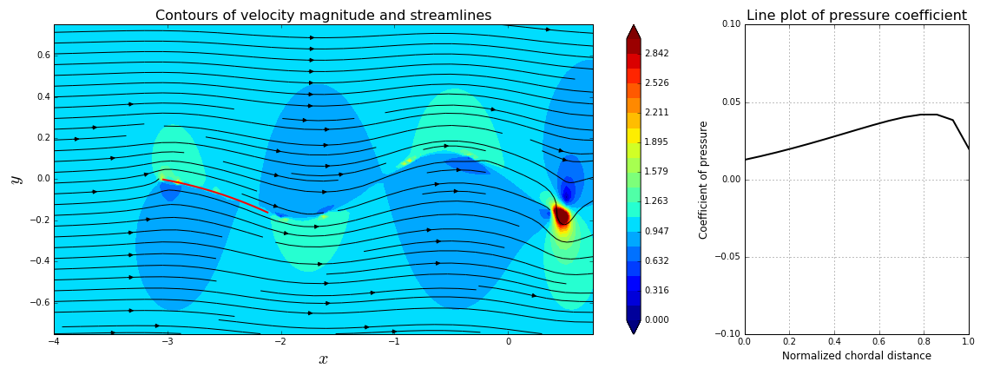

In [20]:
'''
Simulation of pitching-plunging airfoil
'''

N_panels = 15
ITERMAX = 50; dt = 0.05

#for iterate
imotion = 1; iplot_vel = 1
#for panels
AoA = 10; iplot_pan = 0

panels = numpy.empty(N_panels,dtype='object')

panels = create_airfoil_panels(panels, N_panels, AoA, iplot_pan)

X, Y, uplot, vplot, plot_vel,  plot_Cp_data, plot_panels = \
        iterate(panels, ITERMAX , dt, imotion, iplot_vel)
    
create_contour_animation(ITERMAX, X, Y, uplot, vplot, plot_vel,  plot_Cp_data, plot_panels)

<h7 align='justify'>
Whoa! Isn't that something? At the beginning of the first half-period of oscillation, we see greater velocity magnitude (lower pressure) above the airfoil surface and lower velocity magnitude (higher pressure) below the airfoil surface, leading to positive lift. The pressure differential begins at the leading edge of the airfoil and, as the oscillation phase increases beyond $\frac{\pi}{2}$, the pressure differential moves to the trailing edge of the airfoil. 
</h7>

<p align='justify'>
<h7 align='justify'>
As the phase of oscillation increases beyond $\pi$, that is, when the airfoil dives,the pressure differential on either side of the airfoil changes in nature. Thus, the pressure above the airfoil is now higher than that below the airfoil, indicating negative lift. This indicates that in either half-cycle of oscillation, the pressure forces on the airfoil assist the kinematic motion. Again, it must be noted that the streamlines are, at all times, tangent to the airfoil surface, particularly at the trailing edge, indicating that even with dynamic airfoil configurations, the zero-penetration boundary condition and the Kutta condition are satisfied.</h7>

## <b><i>5. Conclusion and further work</i></b>
<p align='justify'>
<h7 align='justify'>
Thus, a two-dimensional transient potential flow solver for thin, lifting airfoils is described. The solver implements a staggered discrete vortex panel method. Simulations results are presented for flow over a uniformly translating airfoil at a positive angle of attack and validated against steady-state results for the same configuration. Further, results for a pitching and plunging airfoil were presented.
</h7>

<p align='justify'>
<h7 align='justify'>
The analysis presented in this report is valid only for thin airfoils, in that the transverse dimensions of the airfoil are neglected. The transient flow modeling algorithm can be extended to thick airfoils by incorporating the linearly varying vortex panel method, described in [<font color='ff0000'>2</font>]. Further, only a qualitative analysis of potential flow over an airfoil, performing pitching and plunging motion, is presented. A more rigorous study can be done using specific kinematic parameters provided in [<font color='ff0000'>2</font>].
</h7>

## <b><i>6. References</i></b>
<h7 align='justify'>
1. Barba L.A. and Mesnard O. (2014) <i>Classical Aerodynamics of potential flow using Python</i>. URL: https://github.com/barbagroup/AeroPython.
</h7>

<p align='justify'>
<h7 align='justify'>
2. Katz J. and Plotkin A. (1991) <i>Low-Speed Aerodynamics</i>. McGraw-Hill Publications, ISBN: 0-07-050446-6.
</h7>

<p align='justify'>
<h7 align='justify'>
3. <i>Equation for a cambered 4-digit NACA airfoil</i>. NACA airfoil Wikipedia page. URL: https://en.wikipedia.org/wiki/NACA_airfoil
</h7>

In [21]:
from IPython.core.display import HTML
css_file = './style.css'
HTML(open(css_file, "r").read())